# Complete Guide to Tracking Your Machine Learning Experiments With MLFlow and DagsHub
## Create reproducible and flexible ML projects
![](images/pexels.jpg)
<figcaption style="text-align: center;">
    <strong>
        Photo by 
        <a href='https://images.pexels.com/photos/2280571/pexels-photo-2280571.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940'>Chokniti Khongchum
        </a>
        on 
        <a href='https://images.pexels.com/photos/2280571/pexels-photo-2280571.jpeg?auto=compress&cs=tinysrgb&dpr=2&h=650&w=940'>Pexels.</a>
    </strong>
</figcaption>

### Introduction

Do you ever get sick of it when people keep saying data scientists spend 80% of their time cleaning data? While it is true, another part of the machine learning workflow deserves as much attention. That's machine learning experimentation. 

### What is experiment tracking in machine learning?

Behind any successful model in production, there lies many failed experiments and ideas. You can't magically end up with the perfect model without making an effort to organizing your workflow and how you approach each new idea.

Experiment tracking in machine learning is about saving and versioning the relevant details (metadata) related to each experiment. Depending on your expectations and business requirements, these details can change but here are the most important ones you need for almost every project and experiment:
- The metric(s)
- Model hyperparameters and structure
- Runtime
- Dependencies of the model
- The code to reproduce the experiment
- The data needed to train the model, etc.

Without the right tools, you will find it extremely cumbersome to manually keep track of so many things. 

### Why bother with experiment tracking?

Experiment tracking isn't about saving a humongous pile of models and hyperparameters. No, it is about keeping track of what works and what doesn't.  

In any serious project, you will try many model types and architectures and it is extremely easy to lose sense of these details. By having a database of all your ideas and their results, you can focus on improving the working prototypes instead of worrying about all the irksome details of the failures. 

Besides, there can be many "best models" in a single project. Having a shared repository for all your experiments makes it easy to sort through them by different requirements. Depending on your constraints, you may choose the model with best validation score, or the one with the shortest runtime or the one with fewest parameters if explainability is your main concern.

And the best way to get started with experiment tracking is by using battle-tested tools that already incorporate all the functionality you need rather than inventing the wheel.

### Setup

Before we get started on the libraries used for experiment tracking, let's perform some setup.

Even though this article can be read on its own, it is part two of the project I've been doing using the Pet Pawpularity competition data from Kaggle. The aim of the project is to predict a pet's cuteness score given its image and metadata.

In [part one](https://towardsdatascience.com/open-source-ml-project-with-dagshub-improve-pet-adoption-with-machine-learning-1-e9403f8f7711?source=your_stories_page----------------------------------------), I explained my approach to solving the problem, the tools I've used and took a first look into the images and their metadata. I suggest you read the EDA section to familiarize yourself. 

You can also run the following commands to download the repo into your environment and set up the dependencies. 

```bash
git clone https://github.com/BexTuychiev/pet_pawpularity.git
cd pet_pawpularity
pip install -r requirements.txt

dvc pull
```

Note that the data files are more than 1GB, so the last `dvc pull` command takes a while to complete. Also, there are many dependencies to install so you may want to avoid that.

In that case, I recommend you to install only these libraries and download the metadata CSV of the images:

```bash
pip install mlflow dagshub pandas scikit-learn xgboost
wget https://dagshub.com/BexTuychiev/pet_pawpularity/raw/8c799cd3c985087f31da10bf3207cf701a0790fa/data/raw/train.csv
```

### Basics of logging experiments with MLFlow

One of the best open-source packages for machine learning experimentation is MLFlow. Though its main attraction is its experiment tracking API, it has got functionalities to package ML projects and deploy them into production. We will only focus on its tracking API today.

The tracking API is designed in the most straightforward way possible. After importing the library, you can start logging model parameters and experiment results right away. Here is an example:

In [8]:
import mlflow

with mlflow.start_run():
    mlflow.log_params(
        {"model_name": "DecisionTreeClassifier", "max_depth": 5, "subsample": 0.8}
    )
    mlflow.log_metrics({"accuracy": 0.83, "roc_auc": 0.80})

These two basic commands generate a special cache inside the root directory called `mlruns`. Here is what it looks like:

```bash
>>> tree
|----data
|----images
|----mlruns
    |----.trash
    |----0
        |----ded60b3b7824422cb74e81827454d33c
            |----artifacts
            |----metrics
            |----params
            |----tags
```

For now, all you need to know about these directories is that you always keep track of them using a version control tool like Git or DVC. Once you have enough experiments to compare, you can run the `mlflow ui` command on the terminal:

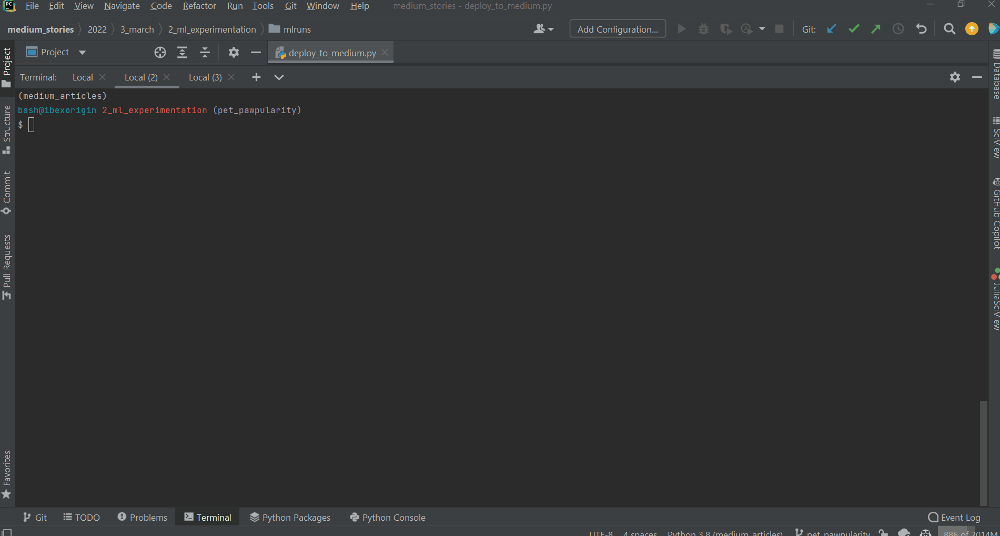

But this local server UI would only be visible to yourself. A better option is to use a free tracking server so that all MLFlow files are stored remotely and is visible to everyone else. This is where DagsHub comes in.

As mentioned in the last article, DagsHub is GitHub for data scientists. Apart from hosting code, it has dedicated storage systems for data version control (DVC) and for experiment tracking with MLFlow. Any repository on DagsHub exposes a remote tracking URI for MLFlow. Here is the one for the [repo of my Pet Pawpularity project](https://dagshub.com/BexTuychiev/pet_pawpularity):

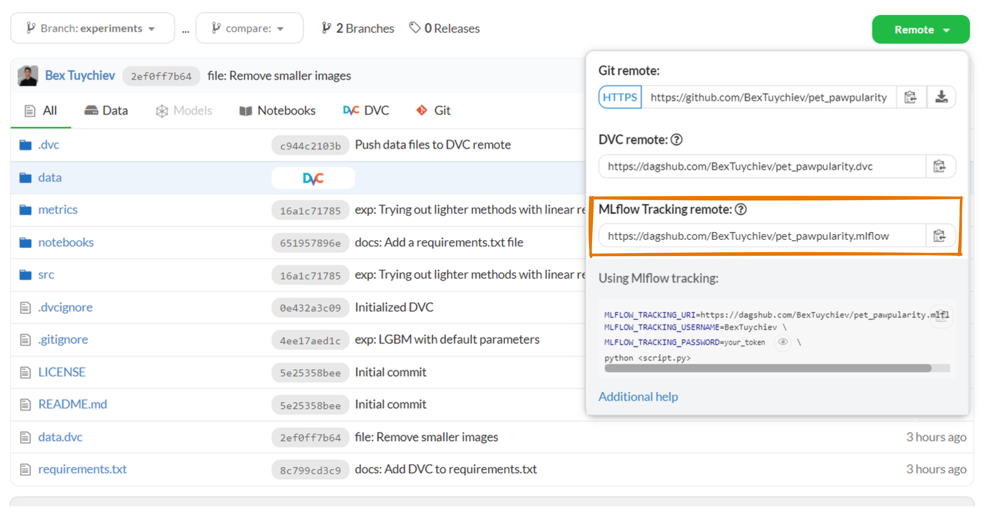

To start sending experiment details to this tracking server, here are the steps you need to take:

In [9]:
import os

import mlflow

mlflow.set_tracking_uri("https://dagshub.com/BexTuychiev/pet_pawpularity.mlflow")

os.environ["MLFLOW_TRACKING_USERNAME"] = "MLFLOW_TRACKING_USERNAME"
os.environ["MLFLOW_TRACKING_PASSWORD"] = "MLFLOW_TRACKING_PASSWORD"

After importing MLFlow, set the tracking URI to the link on your repo page. Then, set two environment variables for your DagsHub username and password, which are found under your DagsHub account settings. 

If you don't want to add sensitive info to your scripts and accidentally commit them to git, you can create environment variables. Here is how you do it on Windows:

```bash
setx MLFLOW_TRACKING_URI "https://dagshub.com/BexTuychiev/pet_pawpularity.mlflow"
setx MLFLOW_TRACKING_USERNAME "your_dagshub_username"
setx MLFLOW_TRACKING_PASSWORD "your_dagshub_password"
```

Or on MacOS:

```bash
export MLFLOW_TRACKING_URI="https://dagshub.com/BexTuychiev/pet_pawpularity.mlflow"
export MLFLOW_TRACKING_USERNAME="your_dagshub_username"
export MLFLOW_TRACKING_PASSWORD="your_dagshub_password"
```

Now, all experiments will be logged to DagsHub and they will be visible under the Experiments tab.  Here is what it looks like for the Pet Pawpularity project (here is a [link](https://dagshub.com/BexTuychiev/pet_pawpularity/experiments/#/)):

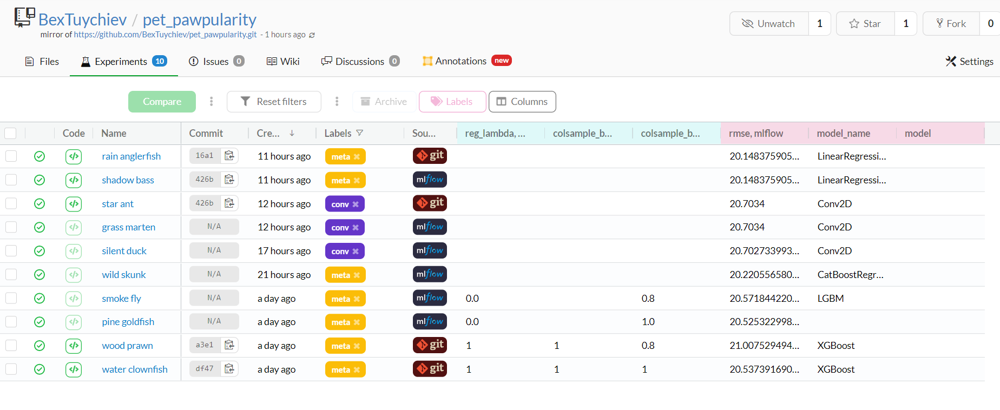

All these experiments were logged manually using the steps I've laid out in the beginning. I've used models from XGBoost, LGBM, CatBoost, Sklearn and Keras. 

This experiments tab has all the functionality that the MLFlow native UI has and offers much more flexibility and design. We will discuss the features of the experiments tab later. 

### Deep dive into MLFlow workflow

So far, we haven't seen the promised automated workflow of MLFlow and its tracking API. We've been logging parameters and metrics manually using `log_params` or `log_metrics`. 

However, this approach can also become tedious after a while because we are still extracting the parameters and metrics on our own. Besides, it would be more work and code to log additional params like runtime, model architecture for neural networks and so on.

To solve this problem, MLFlow exposes separate autologging classes for many popular ML frameworks. Here are some of them:
- sklearn.autolog
- tensorflow.autolog
- keras.autolog
- xgboost.autolog
- lightgbm.autolog
- pytorch.autolog

Each of these auto-logging classes record a model's parameters, training metrics and whenever available, fit params like early stopping, epochs and similar. In the case of Sklearn, the `sklearn.autolog` class also records results of hyperparameter tuning trials with GridSearch or results of Pipeline objects. 

Let's see an example of this class first:

In [11]:
import mlflow

mlflow.sklearn.autolog()


def train_simple(random_state=1121218):
    """
    A function to train simple models on the metadata.
    """
    (x_train, y_train), (x_test, y_test) = get_metadata(random_state=random_state)

    model = RandomForestRegressor(
        n_estimators=1500,
        random_state=random_state,
        max_depth=5,
        min_samples_split=3,
        max_features="sqrt",
    )

    with mlflow.start_run():
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        rmse_test = mean_squared_error(y_test, y_pred, squared=False)

    mlflow.end_run()

You don't have to understand everything that's happening in the code, as there are some custom functions in the code. But if you are curious, here is a high-level overview:

- Line 10: `get_metadata` function loads the Pet Pawpularity metadata training CSV and returns two sets
- Line 12 initializes a RandomForestRegressor example

The crucial part starts with line 20 when we call the `start_run` context manager. MLFlow workflow is based on the concept of runs. A run can be a chunk of code that is written under this `start_run` context manager. Since we called the `sklearn.autolog()` function at the beginning of the script, experiment details that happens after the `start_run` will get recorded, including:
- Model hyperparameters
- Training metrics for regression such as MSE, R2, MAE, etc.
- Custom metrics from `sklearn.metrics` such as RMSE

The `end_run()` function is optional. You should note that in order for the autologger to detect custom metrics from `sklearn.metrics`, you should enable autologger before you import them. Here is the experiment recorded on DagsHub:

![](images/2.gif)

Let's see another autologger example with Keras:

```python
# Enable autolog for keras
mlflow.keras.autolog()

from tensorflow.keras.layers import Dense, Dropout


def train_simple_keras():
    """
    A function to train simple Keras models on the metadata.
    """
    # load metadata
    (x_train, y_train), (x_test, y_test) = get_metadata()

    with mlflow.start_run():
        
        ... Code to build the model...
        
        # Define callbacks
        callbacks = [
            tf.keras.callbacks.EarlyStopping(
                monitor="val_root_mean_squared_error", patience=5
            )
        ]
        # Compile
        model.compile(
            optimizer="adam",
            loss="mse",
            metrics=[tf.keras.metrics.RootMeanSquaredError()],
            callbacks=callbacks,
        )
        
        # Fit
        model.fit(x_train, y_train, epochs=30, validation_data=(x_test, y_test))

    mlflow.end_run()
```

Here is what the code is doing:
- Line 1 enables the keras autologger
- Line 13 starts the run
- Line 15 builds a Keras model with Sequential API
- Lines 18-29 compiles the model with an Early Stopping callback

Let's see how the experiment turned out:

![](images/3.gif)

You can read the docs to learn more about auto-loggers [here](https://mlflow.org/docs/latest/tracking.html#automatic-logging).

### Logging experiments with Git and DagsHub

If this is too much information, you can go for a more lightweight option like DagsHub client package to log your experiments. With `dagshub`, there is virtually no learning curve. Here is a simple function that logs user-defined hyperparameters and metrics to git:

In [13]:
import dagshub  # pip install dagshub


def log_to_git(params, metrics, metrics_path="metrics.csv", hparams_path="params.yaml"):
    """
    A function to log experiments to git using dagshub logger.
    """
    # Create a logger
    logger = dagshub.dagshub_logger(
        metrics_path=metrics_path, hparams_path=hparams_path
    )

    # Log
    with logger as logger:
        logger.log_hyperparams(params)
        logger.log_metrics(metrics)

As soon as you run this function with desired arguments, it will create two files in the project root (unless you specify other locatio as in the function) - `metrics.csv` and `params.yml`. After you add these two files to git and commit the changes, DagsHub recognizes them and puts the params and metrics under the Experiments tab. You will see that those experiments will be marked with the Git label:

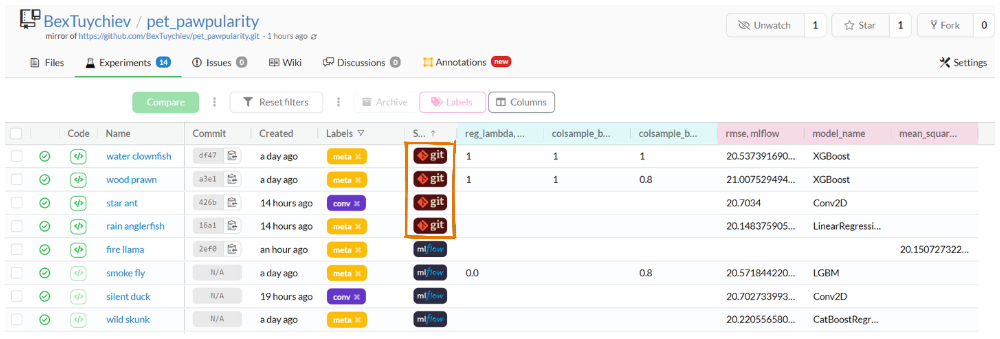

### Analyzing experiment results with DagsHub

Of course, the experiments tab does more than just show a list. The most important feature is comparing experiments. Just select the ones that you want and DagsHub generates a number of useful comparison metrics:

![](images/5.gif)

You can also assign labels to experiments with different targets or data. For example, I used the meta and conv labels to denote that the experiment was using metadata images or convolutions on images. 

Since `dagshub` uses git for tracking and MLFlow can infer the current commit hash, you can directly go to the project state at the time of running the experiment. 

Finally, you can run `git diffs` directly from DagsHub. Here are the steps you can take to see the code and file differences between two experiments:

![](images/6.gif)

After copying the commit hashes of the experiments you want, go to the files tab and paste them into the two fields. The changed files and directories will be highlighted. 

If you press the "File compare" button, you see an in-depth outline of every changed file, script and notebook:

![](images/7.gif)

### Conclusion